In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/vesuvius-challenge-surface-detection/train.csv
/kaggle/input/vesuvius-challenge-surface-detection/test.csv
/kaggle/input/vesuvius-challenge-surface-detection/train_images/1448189335.tif
/kaggle/input/vesuvius-challenge-surface-detection/train_images/1255754809.tif
/kaggle/input/vesuvius-challenge-surface-detection/train_images/3637340207.tif
/kaggle/input/vesuvius-challenge-surface-detection/train_images/3070061281.tif
/kaggle/input/vesuvius-challenge-surface-detection/train_images/215093936.tif
/kaggle/input/vesuvius-challenge-surface-detection/train_images/865516044.tif
/kaggle/input/vesuvius-challenge-surface-detection/train_images/196724516.tif
/kaggle/input/vesuvius-challenge-surface-detection/train_images/2961522369.tif
/kaggle/input/vesuvius-challenge-surface-detection/train_images/3090197578.tif
/kaggle/input/vesuvius-challenge-surface-detection/train_images/840310891.tif
/kaggle/input/vesuvius-challenge-surface-detection/train_images/2579374491.tif
/kaggle/input/

This notebook is not intended to be a comprehensive Exploratory Data Analysis (EDA). Instead, it serves as a focused visual preview of the training dataset to establish a baseline understanding of the imagery and the quality of the annotations.

The primary goal is to compare two specific versions of the training data:

Standard Training Set: The current, active version of the images and labels.

"Deprecated" Training Set: An older or alternative version of the dataset.

By overlaying the masks and inspecting these files side-by-side, we aim to gain a visual intuition regarding:

Feature Alignment: Ensuring the labels correctly map to the biological structures in the scans.

Annotation Completeness: Identifying why specific data was deprecated (e.g., sparse labeling or noise).

Data Consistency: Checking for shifts in resolution, intensity, or metadata between versions.

Technical Breakdown of the Inspection

To perform this inspection, we leverage the tifffile library to access the metadata and image arrays directly. As seen in our initial inspection of the XResolution tag (ID 282), the data is stored in a Rational format (Type 5), which allows us to verify the physical scaling of the scans.

Metadata Inspection: We extract the tag.value, tag.code, and tag.dtype to ensure the file integrity.

Visualization: We use matplotlib to render the images and labels with transparency (α), allowing for a precise quality check of the segmentation boundaries.

In [2]:
!pip install -U tifffile[all]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 77.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.0/232.0 kB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 110.7 MB/s eta 0:00:00
  Attempting uninstall: tifffile
    Found existing installation: tifffile 2025.10.16
    Uninstalling tifffile-2025.10.16:
      Successfully uninstalled tifffile-2025.10.16


In [3]:
# A single file to explore
sample_train_image='/kaggle/input/vesuvius-challenge-surface-detection/train_images/1004283650.tif'

Library for tiff https://pypi.org/project/tifffile/

In [4]:
import tifffile

In [5]:
import math
import random
import json

In [6]:
help(tifffile)

Help on package tifffile:

NAME
    tifffile - Read and write TIFF files.

DESCRIPTION
    Tifffile is a Python library to

    (1) store NumPy arrays in TIFF (Tagged Image File Format) files, and
    (2) read image and metadata from TIFF-like files used in bioimaging.

    Image and metadata can be read from TIFF, BigTIFF, OME-TIFF, GeoTIFF,
    Adobe DNG, ZIF (Zoomable Image File Format), MetaMorph STK, Zeiss LSM,
    ImageJ hyperstack, Micro-Manager MMStack and NDTiff, SGI, NIHImage,
    Olympus FluoView and SIS, ScanImage, Molecular Dynamics GEL,
    Aperio SVS, Leica SCN, Roche BIF, PerkinElmer QPTIFF (QPI, PKI),
    Hamamatsu NDPI, Argos AVS, Philips DP, and ThermoFisher EER formatted files.

    Image data can be read as NumPy arrays or Zarr arrays/groups from strips,
    tiles, pages (IFDs), SubIFDs, higher-order series, and pyramidal levels.

    Image data can be written to TIFF, BigTIFF, OME-TIFF, and ImageJ hyperstack
    compatible files in multi-page, volumetric, pyramida

In [7]:
from tifffile import TiffFile

In [8]:
import matplotlib.pyplot as plt

Visualize multi-page TIFF files by organizing every individual frame into a clean grid.

Multi-Page TIFF Grid Visualization

Dynamic Grid Scaling: It uses math.ceil to automatically calculate the number of rows needed based on a fixed column width (20), ensuring all pages are captured regardless of file size.



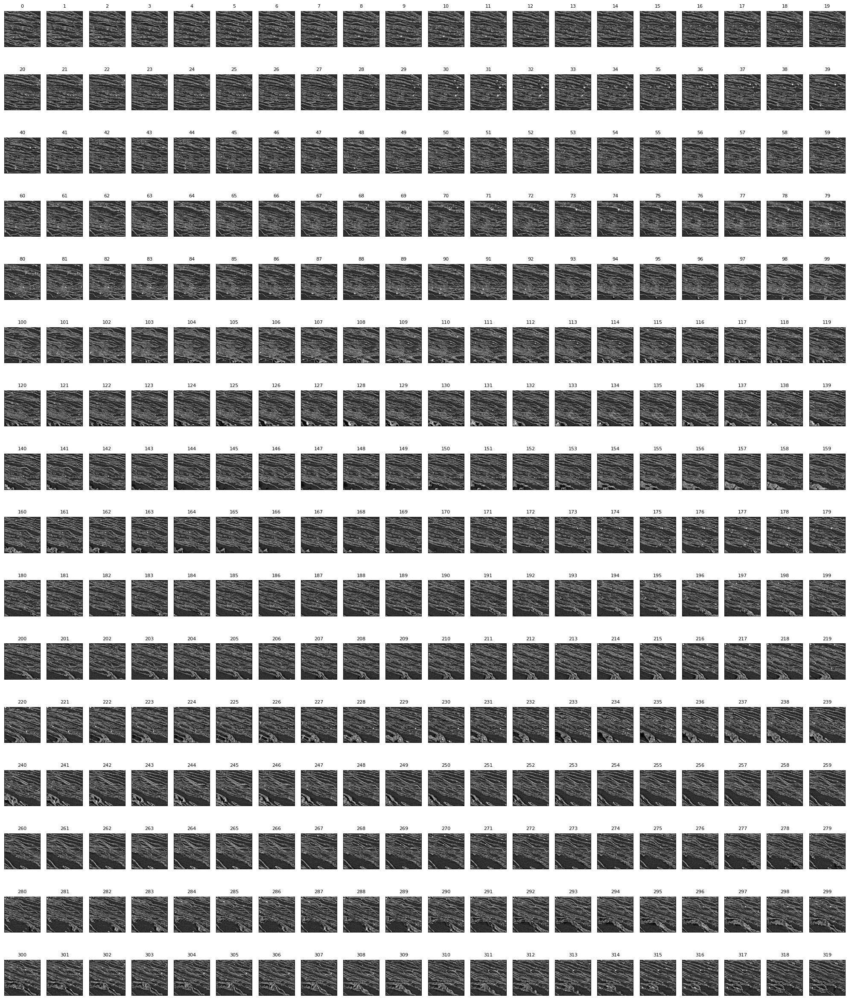

In [9]:
with TiffFile(sample_train_image) as tif:
    num_images = len(tif.pages)
    
    # 1. Setup the Grid Dimensions
    cols = 20  # Number of images per row (increase to make images smaller)
    rows = math.ceil(num_images / cols)
    
    # 2. Create the figure with a large height to accommodate all rows
    # figsize=(width, height). We keep width fixed, height scales with rows.
    fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 1.5))
    
    # Flatten the 2D grid of axes into a 1D list for easy looping
    axes = axes.flatten() 

    # 3. Loop through pages and plot
    for i, page in enumerate(tif.pages):
        image = page.asarray()
        
        # Plot on the specific subplot
        axes[i].imshow(image, cmap='gray')
        axes[i].axis('off')  # Hide axis ticks for a cleaner view
        axes[i].set_title(f"{i}", fontsize=8) # Optional: Add index number

    # 4. Hide any unused empty subplots at the end
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout() # Adjusts spacing to prevent overlap
    plt.show()

Show one random page

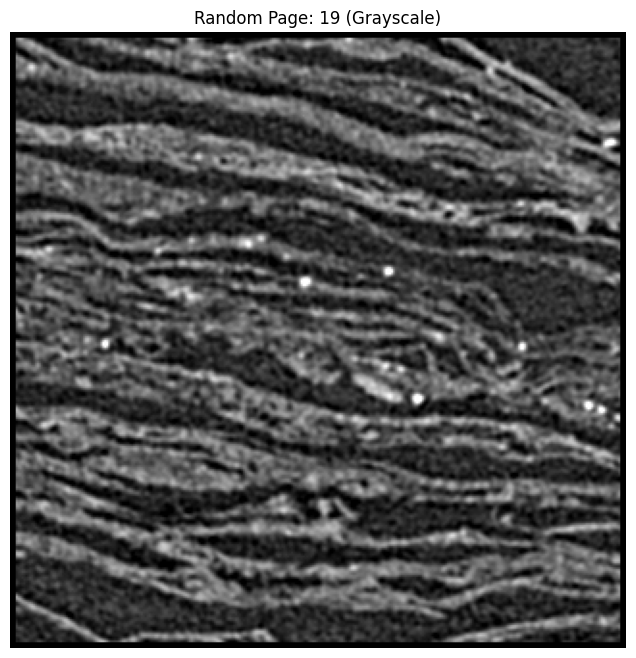

Image Shape: (320, 320)
Data Type: uint8


In [10]:
with TiffFile(sample_train_image) as tif:
    # 1. Get the total number of pages
    num_pages = len(tif.pages)
    
    # 2. Pick a random index
    random_idx = random.randint(0, num_pages - 1)
    
    # 3. Access the random page and convert to array
    target_page = tif.pages[random_idx]
    image = target_page.asarray()
    
    # 4. Display the image
    plt.figure(figsize=(8, 8))
    
    # Check if the image has color channels (usually 3 or 4 channels)
    # If image.ndim is 2, it's grayscale; if 3, it's likely RGB/RGBA
    if image.ndim == 2:
        plt.imshow(image, cmap='gray')
        plt.title(f"Random Page: {random_idx} (Grayscale)")
    else:
        plt.imshow(image)
        plt.title(f"Random Page: {random_idx} (Color)")
        
    plt.axis('off')
    plt.show()

# Optional: Print metadata for the selected page
print(f"Image Shape: {image.shape}")
print(f"Data Type: {image.dtype}")

Medatada visualisation 

In [11]:
with TiffFile(sample_train_image) as tif:
    print(f"--- File Overview ---")
    print(f"Number of pages: {len(tif.pages)}")
    
    # Check if it's a specific type of TIFF (BigTIFF, OME, etc)
    print(f"Is BigTIFF: {tif.is_bigtiff}")
    print(f"Is MDG (Metadata): {tif.is_mdgel}") # Just as an example
    
    # Get metadata from the first page
    first_page = tif.pages[0]
    
    print(f"\n--- Detailed Metadata (Page 0) ---")
    all_tags = {}
    for tag in first_page.tags:
        # We use .name and .value; if value is bytes, we decode it
        name = tag.name
        value = tag.value
        
        # Handle byte strings for better readability
        if isinstance(value, bytes):
            try:
                value = value.decode('utf-8').strip('\x00')
            except:
                pass
                
        all_tags[name] = value
    
    # Print as a nice JSON block
    print(json.dumps(all_tags, indent=4, default=str))

--- File Overview ---
Number of pages: 320
Is BigTIFF: False
Is MDG (Metadata): False

--- Detailed Metadata (Page 0) ---
{
    "ImageWidth": 320,
    "ImageLength": 320,
    "BitsPerSample": 8,
    "Compression": 5,
    "PhotometricInterpretation": 1,
    "ImageDescription": "{\"shape\": [320, 320, 320]}",
    "StripOffsets": [
        256
    ],
    "SamplesPerPixel": 1,
    "RowsPerStrip": 320,
    "StripByteCounts": [
        113162
    ],
    "XResolution": [
        1,
        1
    ],
    "YResolution": [
        1,
        1
    ],
    "ResolutionUnit": 1,
    "Software": "tifffile.py"
}


Specific metadata

In [12]:
with TiffFile(sample_train_image) as tif:
    # Check for specialized metadata formats
    if tif.is_geotiff:
        print("GeoTIFF Metadata:", tif.geotiff_metadata)
        
    if tif.is_imagej:
        print("ImageJ Metadata:", tif.imagej_metadata)
        
    # Print the shape and axes (e.g., 'CYX' for Color, Y-axis, X-axis)
    print("\nData Layout:")
    for series in tif.series:
        print(f"Shape: {series.shape}, Axes: {series.axes}")


Data Layout:
Shape: (320, 320, 320), Axes: QYX


Explore Labels ( one label)

In [13]:
sample_train_label='/kaggle/input/vesuvius-challenge-surface-detection/train_labels/1004283650.tif'

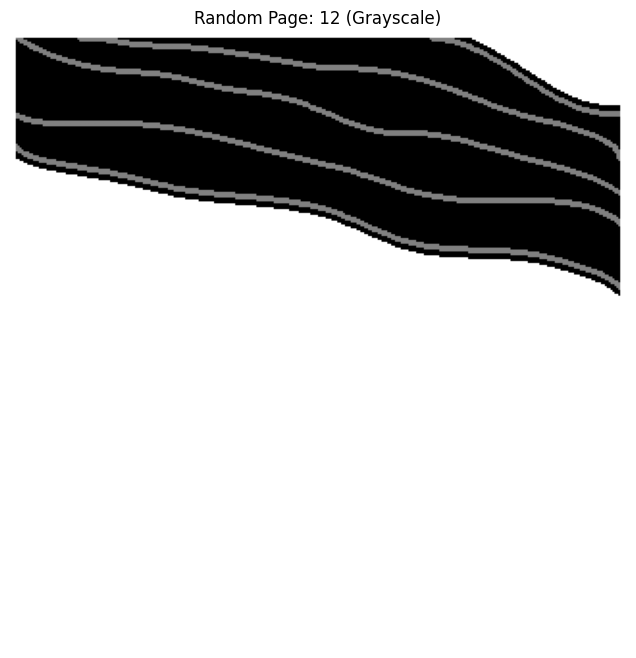

Image Shape: (320, 320)
Data Type: uint8


In [14]:
with TiffFile(sample_train_label) as tif:
    # 1. Get the total number of pages
    num_pages = len(tif.pages)
    
    # 2. Pick a random index
    random_idx = random.randint(0, num_pages - 1)
    
    # 3. Access the random page and convert to array
    target_page = tif.pages[random_idx]
    image = target_page.asarray()
    
    # 4. Display the image
    plt.figure(figsize=(8, 8))
    
    # Check if the image has color channels (usually 3 or 4 channels)
    # If image.ndim is 2, it's grayscale; if 3, it's likely RGB/RGBA
    if image.ndim == 2:
        plt.imshow(image, cmap='gray')
        plt.title(f"Random Page: {random_idx} (Grayscale)")
    else:
        plt.imshow(image)
        plt.title(f"Random Page: {random_idx} (Color)")
        
    plt.axis('off')
    plt.show()

# Optional: Print metadata for the selected page
print(f"Image Shape: {image.shape}")
print(f"Data Type: {image.dtype}")

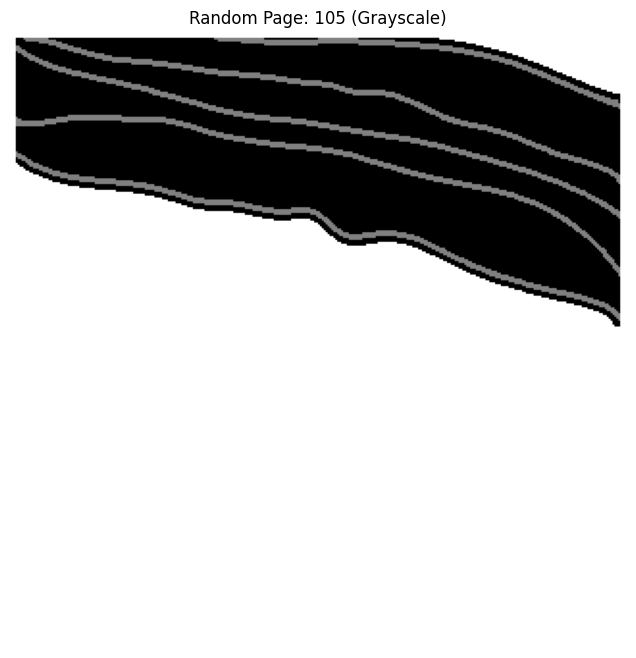

Image Shape: (320, 320)
Data Type: uint8


In [15]:
with TiffFile(sample_train_label) as tif:
    # 1. Get the total number of pages
    num_pages = len(tif.pages)
    
    # 2. Pick a random index
    random_idx = random.randint(0, num_pages - 1)
    
    # 3. Access the random page and convert to array
    target_page = tif.pages[random_idx]
    image = target_page.asarray()
    
    # 4. Display the image
    plt.figure(figsize=(8, 8))
    
    # Check if the image has color channels (usually 3 or 4 channels)
    # If image.ndim is 2, it's grayscale; if 3, it's likely RGB/RGBA
    if image.ndim == 2:
        plt.imshow(image, cmap='gray')
        plt.title(f"Random Page: {random_idx} (Grayscale)")
    else:
        plt.imshow(image)
        plt.title(f"Random Page: {random_idx} (Color)")
        
    plt.axis('off')
    plt.show()

# Optional: Print metadata for the selected page
print(f"Image Shape: {image.shape}")
print(f"Data Type: {image.dtype}")

In [16]:
with TiffFile(sample_train_label) as tif:
    print(f"--- File Overview ---")
    print(f"Number of pages: {len(tif.pages)}")
    
    # Check if it's a specific type of TIFF (BigTIFF, OME, etc)
    print(f"Is BigTIFF: {tif.is_bigtiff}")
    print(f"Is MDG (Metadata): {tif.is_mdgel}") # Just as an example
    
    # Get metadata from the first page
    first_page = tif.pages[0]
    
    print(f"\n--- Detailed Metadata (Page 0) ---")
    all_tags = {}
    for tag in first_page.tags:
        # We use .name and .value; if value is bytes, we decode it
        name = tag.name
        value = tag.value
        
        # Handle byte strings for better readability
        if isinstance(value, bytes):
            try:
                value = value.decode('utf-8').strip('\x00')
            except:
                pass
                
        all_tags[name] = value
    
    # Print as a nice JSON block
    print(json.dumps(all_tags, indent=4, default=str))

--- File Overview ---
Number of pages: 320
Is BigTIFF: False
Is MDG (Metadata): False

--- Detailed Metadata (Page 0) ---
{
    "ImageWidth": 320,
    "ImageLength": 320,
    "BitsPerSample": 8,
    "Compression": 5,
    "PhotometricInterpretation": 1,
    "ImageDescription": "{\"shape\": [320, 320, 320]}",
    "StripOffsets": [
        256
    ],
    "SamplesPerPixel": 1,
    "RowsPerStrip": 320,
    "StripByteCounts": [
        537
    ],
    "XResolution": [
        1,
        1
    ],
    "YResolution": [
        1,
        1
    ],
    "ResolutionUnit": 1,
    "Software": "tifffile.py"
}


In [17]:
with TiffFile(sample_train_label) as tif:
    # Check for specialized metadata formats
    if tif.is_geotiff:
        print("GeoTIFF Metadata:", tif.geotiff_metadata)
        
    if tif.is_imagej:
        print("ImageJ Metadata:", tif.imagej_metadata)
        
    # Print the shape and axes (e.g., 'CYX' for Color, Y-axis, X-axis)
    print("\nData Layout:")
    for series in tif.series:
        print(f"Shape: {series.shape}, Axes: {series.axes}")


Data Layout:
Shape: (320, 320, 320), Axes: QYX


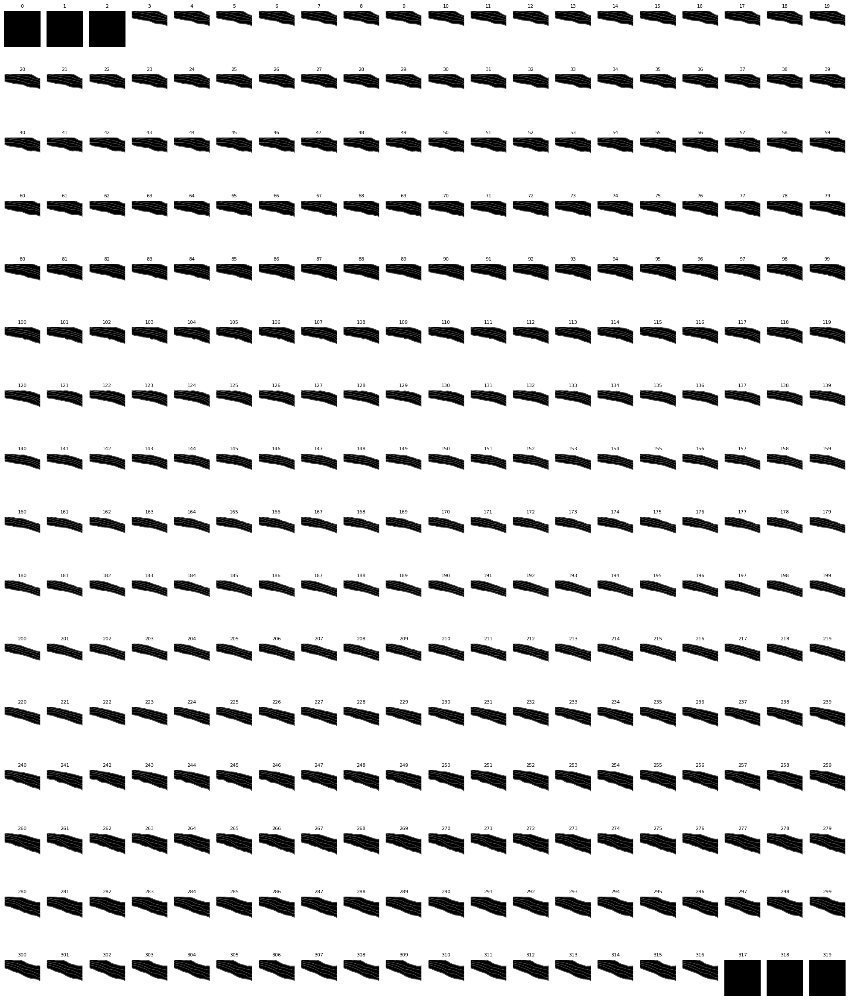

In [18]:
with TiffFile(sample_train_label) as tif:
    num_images = len(tif.pages)
    
    # 1. Setup the Grid Dimensions
    cols = 20  # Number of images per row (increase to make images smaller)
    rows = math.ceil(num_images / cols)
    
    # 2. Create the figure with a large height to accommodate all rows
    # figsize=(width, height). We keep width fixed, height scales with rows.
    fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 1.5))
    
    # Flatten the 2D grid of axes into a 1D list for easy looping
    axes = axes.flatten() 

    # 3. Loop through pages and plot
    for i, page in enumerate(tif.pages):
        image = page.asarray()
        
        # Plot on the specific subplot
        axes[i].imshow(image, cmap='gray')
        axes[i].axis('off')  # Hide axis ticks for a cleaner view
        axes[i].set_title(f"{i}", fontsize=8) # Optional: Add index number

    # 4. Hide any unused empty subplots at the end
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout() # Adjusts spacing to prevent overlap
    plt.show()

SIde by side Training and Labels

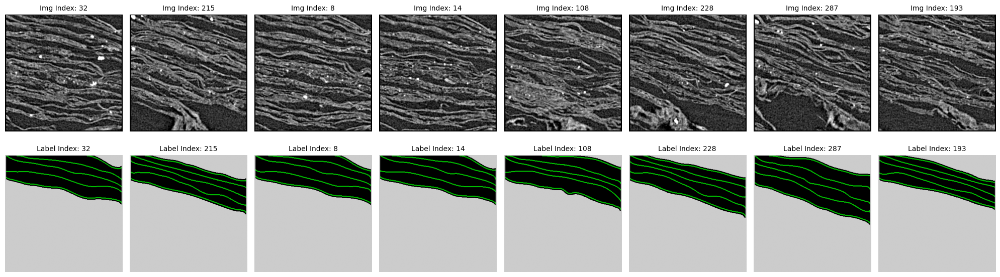

In [19]:
with TiffFile(sample_train_image) as tif_img, TiffFile(sample_train_label) as tif_lbl:
    num_pages = len(tif_img.pages)
    
    # 1. Pick 8 random indices
    indices = random.sample(range(num_pages), 8)
    
    # 2. Setup the plot (2 rows, 8 columns)
    fig, axes = plt.subplots(2, 8, figsize=(20, 6))
    
    for i, idx in enumerate(indices):
        # Load image and label for the same index
        img_array = tif_img.pages[idx].asarray()
        lbl_array = tif_lbl.pages[idx].asarray()
        
        # --- Top Row: Images ---
        axes[0, i].imshow(img_array, cmap='gray' if img_array.ndim == 2 else None)
        axes[0, i].set_title(f"Img Index: {idx}", fontsize=10)
        axes[0, i].axis('off')
        
        # --- Bottom Row: Labels ---
        # We often use 'jet' or 'viridis' for labels to make classes stand out
        axes[1, i].imshow(lbl_array, cmap='nipy_spectral') 
        axes[1, i].set_title(f"Label Index: {idx}", fontsize=10)
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()

Overlaying labels with transparency is the gold standard for verifying segmentation quality. It allows you to see exactly where a mask might be "bleeding" over an edge or missing a feature.

The key technique here is to plot the image first, then plot the label immediately after with an alpha parameter (transparency) on the same axis.

Overlaying Masks with Alpha

In this code, we'll pick 4 random samples to show them at a larger, clearer size.with TiffFile(sample_train_image) as tif_img, 

Issue with Ground Truth Completeness in TIFF Segmentation Dataset

We are visualizing a multi-page TIFF dataset (images and corresponding semantic labels) using tifffile and matplotlib. Upon overlaying the masks with transparency (α=0.5), I’ve noticed a consistent discrepancy in the labeling completeness.

As seen in the attached overlays, the segmentation masks appear "under-segmented" or incomplete:

(Yellow Masks): Large regions of high-intensity features are left unmasked, while only a small strip is labeled.

 Questions:

Dataset Intent: Is this a "sparse labeling" strategy where only specific instances are labeled, or should every visible feature be captured in the ground truth?

Preprocessing Error: Could this be a result of a misalignment in the TIFF pages between the sample_train_image and sample_train_label files?

Model Impact: If I train a model on these partially labeled images, how should I handle the "unlabeled" features to prevent the model from learning them as "background"?

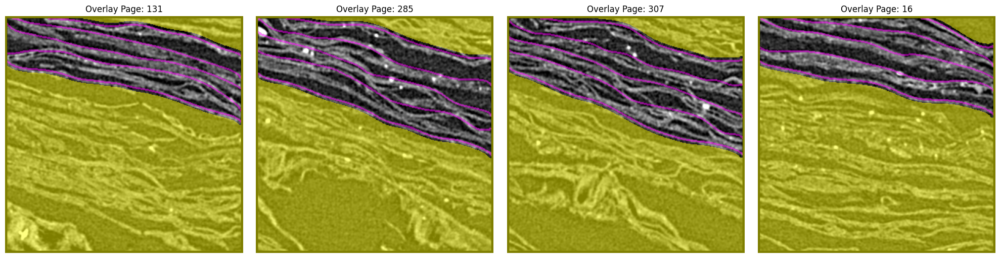

In [20]:
with TiffFile(sample_train_image) as tif_img, TiffFile(sample_train_label) as tif_lbl:
    num_pages = len(tif_img.pages)
    indices = random.sample(range(num_pages), 4) # Showing 4 for better detail
    
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    for i, idx in enumerate(indices):
        img = tif_img.pages[idx].asarray()
        lbl = tif_lbl.pages[idx].asarray()
        
        # 1. Display the base image
        axes[i].imshow(img, cmap='gray')
        
        # 2. Overlay the label
        # alpha=0.5 makes it 50% transparent
        # cmap='jet' or 'rainbow' helps distinguish different classes
        # we mask the '0' values (background) so they remain fully transparent
        import numpy as np
        masked_lbl = np.ma.masked_where(lbl == 0, lbl) 
        
        axes[i].imshow(masked_lbl, cmap='spring', alpha=0.5)
        
        axes[i].set_title(f"Overlay Page: {idx}")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

This code snippet demonstrates how to access and inspect specific metadata tags within a TIFF file using the Python tifffile library. In this specific example, the code is extracting the XResolution tag from the first page of the file temp.tif.

TIFF files are container formats that store image data alongside a rich set of metadata tags (like resolution, dimensions, and color space). This snippet breaks down the properties of a single tag object.

A short glimpse in deprecated dataset.

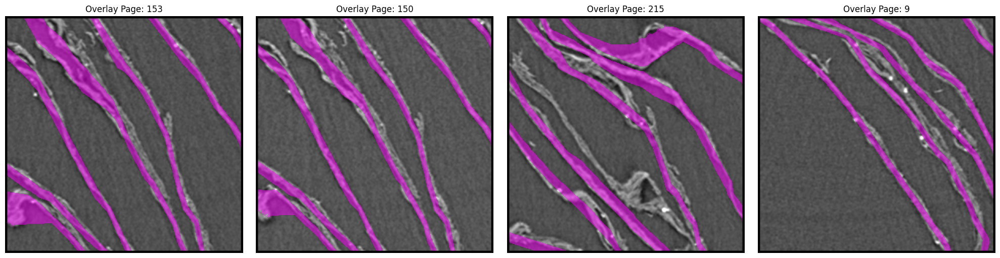

In [21]:
sample_train_image='/kaggle/input/vesuvius-challenge-surface-detection/deprecated_train_images/1407735.tif'
sample_train_label='/kaggle/input/vesuvius-challenge-surface-detection/deprecated_train_labels/1407735.tif'
with TiffFile(sample_train_image) as tif_img, TiffFile(sample_train_label) as tif_lbl:
    num_pages = len(tif_img.pages)
    indices = random.sample(range(num_pages), 4) # Showing 4 for better detail
    
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    for i, idx in enumerate(indices):
        img = tif_img.pages[idx].asarray()
        lbl = tif_lbl.pages[idx].asarray()
        
        # 1. Display the base image
        axes[i].imshow(img, cmap='gray')
        
        # 2. Overlay the label
        # alpha=0.5 makes it 50% transparent
        # cmap='jet' or 'rainbow' helps distinguish different classes
        # we mask the '0' values (background) so they remain fully transparent
        import numpy as np
        masked_lbl = np.ma.masked_where(lbl == 0, lbl) 
        
        axes[i].imshow(masked_lbl, cmap='spring', alpha=0.5)
        
        axes[i].set_title(f"Overlay Page: {idx}")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

In [22]:
with TiffFile(sample_train_image) as tif:
        tag = tif.pages[0].tags['XResolution']

In [23]:
tag.value

(1, 1)

In [24]:
tag.name

'XResolution'

In [25]:
tag.code

282

In [26]:
tag.count

1